# Digital Signal and Image Processing Project - Image Retrieval

# Imports and Dataset

In [1]:
from google.colab import drive
import zipfile
import shutil
import os
import numpy as np
import random as python_random
import matplotlib.pyplot as plt
import pandas as pd
import json

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.neighbors import KDTree
from sklearn.metrics import accuracy_score, classification_report

from keras.layers import Input, Lambda
from keras.optimizers import Adam
from keras import backend as K
from keras.models import Model
from keras.layers import Dense, GlobalAveragePooling2D, Dropout, Activation
from keras.models import Sequential, Model
from keras.layers import ZeroPadding2D, Convolution2D, MaxPooling2D, Dropout, Flatten, Activation
from keras.optimizers import SGD
from keras.utils import to_categorical
from keras.preprocessing import image
from keras import applications
import numpy as np
from IPython.core.display import Image
from tensorflow.keras.callbacks import EarlyStopping

from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras import layers, Model
from tensorflow.keras.metrics import Metric
from scipy.spatial.distance import cdist
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler

np.random.seed(0)
python_random.seed(0)
tf.random.set_seed(0)
keras.utils.set_random_seed(0)
drive.mount('/content/drive')

Mounted at /content/drive


## Dataset Import and Split

The dataset is imported, extracted and divided into train-val-test sets, with a proportion of 60-20-20.

The folder "dataset" is created which contains 3 sub folders for the 3 splits. The images are still divided by category.

Dictionaries are used to map label indices to their corresponding category names and vice versa.

### For Pre-Trained approach

In [2]:
# Transfer dataset, and extract files
shutil.copy('/content/drive/My Drive/MammalsDataset.zip', 'MammalsDataset.zip')
zipf = zipfile.ZipFile('MammalsDataset.zip')
zipf.extractall()
zipf.close()

os.remove('MammalsDataset.zip') # Delete the copied zip file

In [3]:
dataset_origin_path = "mammals"
dataset_path = "dataset"
train_ratio, val_ratio, test_ratio = 0.6, 0.2, 0.2

# Create destination directories
for split in ['train', 'val', 'test']:
    split_path = os.path.join(dataset_path, split)
    os.makedirs(split_path, exist_ok=True)

# Iterate through each category (sub-folder)
for category in sorted(os.listdir(dataset_origin_path)):
    category_path = os.path.join(dataset_origin_path, category)

    images = sorted(os.listdir(category_path))
    python_random.seed(0)
    python_random.shuffle(images)

    train_end = int(train_ratio * len(images))
    val_end = train_end + int(val_ratio * len(images))

    splits = {
        'train': images[:train_end],
        'val': images[train_end:val_end],
        'test': images[val_end:]
    }

    # Move images to respective directories
    for split, split_images in splits.items():
        split_category_path = os.path.join(dataset_path, split, category)
        os.makedirs(split_category_path, exist_ok=True)

        for img in split_images:
            shutil.move(os.path.join(category_path, img), os.path.join(split_category_path, img))

    # Remove empty category folder
    os.rmdir(category_path)

# Remove the original dataset folder if empty
if not os.listdir(dataset_origin_path):
    os.rmdir(dataset_origin_path)

print("Dataset split completed successfully.")


Dataset split completed successfully.


Dictionaries are created in order to map label indices to their corresponding category names and vice versa, whenever this will be needed later in the project.

In [4]:
category_names = sorted([d for d in os.listdir(dataset_path + "/train") if os.path.isdir(os.path.join(dataset_path + "/train", d))])
category_to_index = {name: i for i, name in enumerate(category_names)}
index_to_category = {i: name for name, i in category_to_index.items()}

# Pre-Trained CNN Approach
This section explores the base approach of extracting the feature arrays from a pre-trained network (MobileNetV2), and using a kd-tree to retrieve similar images quickly.

## Functions

In [5]:
def extract_features(model, root_folder, category_to_index, preprocess_function, image_size=(224, 224)):
    """
    Extract features from images in a root folder organized into subfolders by labels.
    Returns the features, the labels, and the corresponding image paths.
    """
    features = []
    labels = []
    image_paths = []

    for category in sorted(os.listdir(root_folder)):
        category_path = os.path.join(root_folder, category)
        print("Processing folder", category_path)

        if os.path.isdir(category_path):
            if category not in category_to_index:
                print(f"Skipping folder '{category}' as it is not in the category mapping.")
                continue

            label = category_to_index[category]  # Convert category name to label index

            image_files = [fname for fname in os.listdir(category_path) if fname.lower().endswith(('jpg', 'jpeg', 'png'))]

            for fname in image_files:
                image_path = os.path.join(category_path, fname)

                image = load_img(image_path, target_size=image_size)
                image_array = img_to_array(image)
                image_array = preprocess_function(image_array)
                image_array = np.expand_dims(image_array, axis=0)

                feature = model.predict(image_array, verbose=0)

                features.append(feature.flatten())
                labels.append(label)
                image_paths.append(image_path)

    return np.array(features), np.array(labels), image_paths

In [6]:
def load_or_compute_features(model, features_path, labels_path, paths_path, images_folder, category_to_index, preprocess_function=preprocess_input):
    """
    This function loads the saved features, labels and image paths (if available),
    otherwise it computes, saves them and returns them.
    """
    # Check if the feature, label, and image path files exist
    if os.path.exists(features_path):
        # Load the files if they exist
        train_features = np.load(features_path)
        train_labels = np.load(labels_path)
        train_image_paths = list(np.load(paths_path, allow_pickle=True))
        print("Loaded existing files.")
    else:
        # Otherwise, compute them
        print("Files missing, computing features...")
        train_features, train_labels, train_image_paths = extract_features(model, images_folder, category_to_index, preprocess_function)

        # Create the folder if it doesn't exist already
        features_save_folder = os.path.dirname(features_path)
        if not os.path.exists(features_save_folder):
            os.makedirs(features_save_folder)

        # Save the computed features, labels, and image paths
        np.save(features_path, train_features)
        np.save(labels_path, train_labels)
        np.save(paths_path, train_image_paths)
        print("Computed and saved new features.")

    return train_features, train_labels, train_image_paths

## Feature Extraction

Extraction of the features for every image in the train, val and test set. The numpy arrays are saved to disk to avoid re-computing them in later executions.

In [7]:
# Load of MobileNetV2 without the top layer
mobilenet = MobileNetV2(weights="imagenet", include_top=False, pooling="avg", input_shape=(224, 224, 3))

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [8]:
dataset_train_path = dataset_path + "/train"
prefix = "/content/drive/My Drive/" #""
train_features_path = prefix + "IR Saves/Pre-Trained Approach/train_features.npy"
train_labels_path = prefix + "IR Saves/Pre-Trained Approach/train_labels.npy"
train_image_names_path = prefix + "IR Saves/Pre-Trained Approach/train_image_names.npy"

train_features, train_labels, train_image_paths = load_or_compute_features(mobilenet, train_features_path, train_labels_path, train_image_names_path, dataset_train_path, category_to_index)

Loaded existing files.


In [9]:
dataset_val_path = dataset_path + "/val"
val_features_path = prefix + "IR Saves/Pre-Trained Approach/val_features.npy"
val_labels_path = prefix + "IR Saves/Pre-Trained Approach/val_labels.npy"
val_image_names_path = prefix + "IR Saves/Pre-Trained Approach/val_image_names.npy"

val_features, val_labels, val_image_paths = load_or_compute_features(mobilenet, val_features_path, val_labels_path, val_image_names_path, dataset_val_path, category_to_index)

Loaded existing files.


In [10]:
dataset_test_path = dataset_path + "/test"
test_features_path = prefix + "IR Saves/Pre-Trained Approach/test_features.npy"
test_labels_path = prefix + "IR Saves/Pre-Trained Approach/test_labels.npy"
test_image_names_path = prefix + "IR Saves/Pre-Trained Approach/test_image_names.npy"

test_features, test_labels, test_image_paths = load_or_compute_features(mobilenet, test_features_path, test_labels_path, test_image_names_path, dataset_test_path, category_to_index)

Loaded existing files.


This means that the train features are 1280 long arrays, for each of the 8234 images.

In [11]:
train_features.shape

(8234, 1280)

## Image Retrieval and Evaluation
This section creates the kd-tree, evaluates it and explores the results.

### Functions

In [136]:
def print_retrieved_images(train_image_paths, test_image_paths, test_image_indices, query_indexes, query_distances):
    """
    Plots the query image and its k nearest neighbors for each test image.
    """
    # Number of test images to plot
    num_test_images = len(test_image_indices)

    # Number of nearest neighbors to display
    k = len(query_indexes[0])

    # Adjust the figsize dynamically based on the number of images to display horizontally
    fig_width = 3 * (k + 1)  # 1 for the query image and k for neighbors
    fig_height = 3 * num_test_images  # 3 units of height per image row

    # Set up the plot with multiple rows (one for each test image) and (k + 1) columns (1 for the query image and k for neighbors)
    fig, axes = plt.subplots(num_test_images, k + 1, figsize=(fig_width, fig_height))

    # Loop over each test image index
    for i, test_image_index in enumerate(test_image_indices):
        # Get the test image
        test_image_path = test_image_paths[test_image_index]
        test_image = load_img(test_image_path)

        # Extract category (folder name) and image name for the test image
        test_image_category = os.path.basename(os.path.dirname(test_image_path))
        test_image_name = os.path.basename(test_image_path)


        if (len(test_image_indices)!=1):
            # Plot the test image (query)
            axes[i, 0].imshow(test_image)
            axes[i, 0].set_title(f"Query:\n {test_image_name}")
            axes[i, 0].axis('off')  # Hide axes for the image
        else:
            # Plot the test image (query)
            axes[0].imshow(test_image)
            axes[0].set_title(f"Query:\n {test_image_name}")
            axes[0].axis('off')  # Hide axes for the image

        # Plot the k nearest images
        for j, (index, dist) in enumerate(zip(query_indexes[i], query_distances[i])):
            # Load the neighbor image
            neighbor_image_path = train_image_paths[index]
            neighbor_image = load_img(neighbor_image_path)

            # Extract the category (folder name) and name for the neighbor image
            neighbor_category = os.path.basename(os.path.dirname(neighbor_image_path))
            neighbor_name = os.path.basename(neighbor_image_path)

            if (len(test_image_indices)!=1):
                # Plot the neighbor image
                axes[i, j + 1].imshow(neighbor_image)
                axes[i, j + 1].set_title(f"{neighbor_name}\n(Dist: {dist:.2f})")
                axes[i, j + 1].axis('off')  # Hide axes for the image
            else:
                # Plot the neighbor image
                axes[j + 1].imshow(neighbor_image)
                axes[j + 1].set_title(f"{neighbor_name}\n(Dist: {dist:.2f})")
                axes[j + 1].axis('off')  # Hide axes for the image

    plt.tight_layout()
    plt.show()

In [13]:
def evaluate_performance(query_indexes, test_labels, train_labels, index_to_category, k=3):
    """
    Evaluate the performance of the using the provided indices.
    For each test image, check each of the k nearest neighbors individually.
    """
    # List to store predictions and true labels for classification report
    predicted_labels = []
    true_labels = []

    # Loop over each test image
    for i, query_index in enumerate(query_indexes):
        # Get the true label for the test image
        true_label = test_labels[i]

        # Get the labels of the k nearest neighbors
        neighbor_labels = train_labels[query_index]

        # Check each neighbor individually and append to predictions
        for neighbor_label in neighbor_labels:
            predicted_labels.append(neighbor_label)  # Store the predicted neighbor label
            true_labels.append(true_label)           # Store the true label for the test sample

    # Calculate accuracy
    accuracy = accuracy_score(true_labels, predicted_labels)
    print(f"Accuracy: {accuracy * 100:.2f}%")

    # Generate the classification report
    print("\nClassification Report:")

    # Convert numeric labels to category names using index_to_category
    category_names = [index_to_category[label] for label in np.unique(train_labels)]

    # Print the classification report with category names
    print(classification_report(true_labels, predicted_labels, target_names=category_names))

    # Generate classification report as a dictionary for easier extraction of metrics
    report = classification_report(true_labels, predicted_labels, target_names=category_names, output_dict=True)

    # Extract precision, recall, and f1-score for each class
    class_report = []
    for class_name, metrics in report.items():
        if class_name not in ['accuracy', 'macro avg', 'weighted avg']:  # Ignore overall averages
            class_report.append({
                'Class': class_name,
                'Precision': metrics['precision'],
                'Recall': metrics['recall'],
                'F1-Score': metrics['f1-score']
            })

    # Convert the class report to a DataFrame
    report_df = pd.DataFrame(class_report)

    return report_df


In [14]:
def calculate_anmrr(query_indexes, test_labels, train_labels, k=3):
    """
    Calculate Average Normalized Modified Retrieval Rank (ANMRR)s.
    """
    tests_number = len(query_indexes)  # Number of queries
    total_score = 0

    for i, query_index in enumerate(query_indexes):
        true_label = test_labels[i]  # True label of the current query

        # Get the labels of the k nearest neighbors
        neighbor_labels = train_labels[query_index]

        # Compute AVR(q) - the average rank of relevant documents
        relevant_ranks = []
        for rank, neighbor_label in enumerate(neighbor_labels):
            if neighbor_label == true_label:
                relevant_ranks.append(rank + 1)  # Add 1 to convert from 0-indexed to 1-indexed rank

        if relevant_ranks:
            average_rank_relevant_documents = np.mean(relevant_ranks)  # Average rank of relevant documents
        else:
            average_rank_relevant_documents = k + 1  # If no relevant documents found, set to K + 1

        # Calculate the ANMRR for the query
        number_relevant_documents = 1
        denominator = 1.25 * k - 0.5 * (1 + number_relevant_documents)
        if denominator == 0:  # Handle case when the denominator becomes zero
            continue  # Skip this query, as division by zero is not valid

        score = (average_rank_relevant_documents - 0.5 * (1 + number_relevant_documents)) / denominator
        total_score += score

    # Return the final ANMRR score
    ANMRR = total_score / tests_number
    return ANMRR

In [15]:
def retrieve_and_evaluate_category(kd_tree, category_name, num_images, root_test_folder, category_to_index, test_features):
    """
    Retrieves and evaluates images for a specific category using a KD-Tree.
    """

    print(f"Retrieving images for category {category_name}...")

    # Get the category index from the category name using the category_to_index mapping
    if category_name not in category_to_index:
        raise ValueError(f"Category '{category_name}' not found in the category_to_index mapping.")

    category_index = category_to_index[category_name]

    # Find indices of test images belonging to the specified category
    test_image_indices = [i for i, label in enumerate(test_labels) if label == category_index]

    # Limit the number of images to num_images (if available)
    test_image_indices = test_image_indices[:min(num_images, len(test_image_indices))]

    # Extract features for the selected test images
    test_images = test_features[test_image_indices]

    # Perform k-NN search using the KD-Tree
    k = 3  # Number of neighbors to retrieve
    query_distances, query_indexes = kd_tree.query(test_images, k=k)

    # Print retrieved images
    print_retrieved_images(train_image_paths, test_image_paths, test_image_indices, query_indexes, query_distances)

    # Calculate and print ANMRR
    anmrr_value = calculate_anmrr(query_indexes, test_labels[test_image_indices], train_labels, k=k)
    print(f"ANMRR for category {category_name}: {anmrr_value:.4f}")

### KD-Tree

The kd-tree is created on the train fetures that were extracted earlier.

In [16]:
kd_tree = KDTree(train_features)

#### Testing on a few images

Testing the kd-tree and its returned data on 3 random images.

In [17]:
len(test_features)

2786

The images are picked with 3 random indices, and their respective feature arrays are retrieved.

In [18]:
test_image_indices = [0, 1000, 2000]
test_images = test_features[test_image_indices]
test_images.shape

(3, 1280)

5 images are retrieved for each one of the 3 test images.

In [19]:
distances, indices = kd_tree.query(test_images, k=5)

In [20]:
distances

array([[11.03307243, 11.22979231, 11.47296629, 11.67219312, 11.89626432],
       [19.99151276, 20.46101651, 20.55449555, 20.65282685, 20.84600871],
       [ 8.80263062,  9.50034036,  9.67818208,  9.76843459,  9.97604431]])

In [21]:
indices

array([[  96,  187,    5,   95,   13],
       [2852, 7372, 2843, 2931, 2930],
       [5929, 5916, 5955, 5904, 5914]])

This function takes the result of the kd-tree query and displays dynamically the original image and all of the retrieved images, with useful informations displayed in the titles.

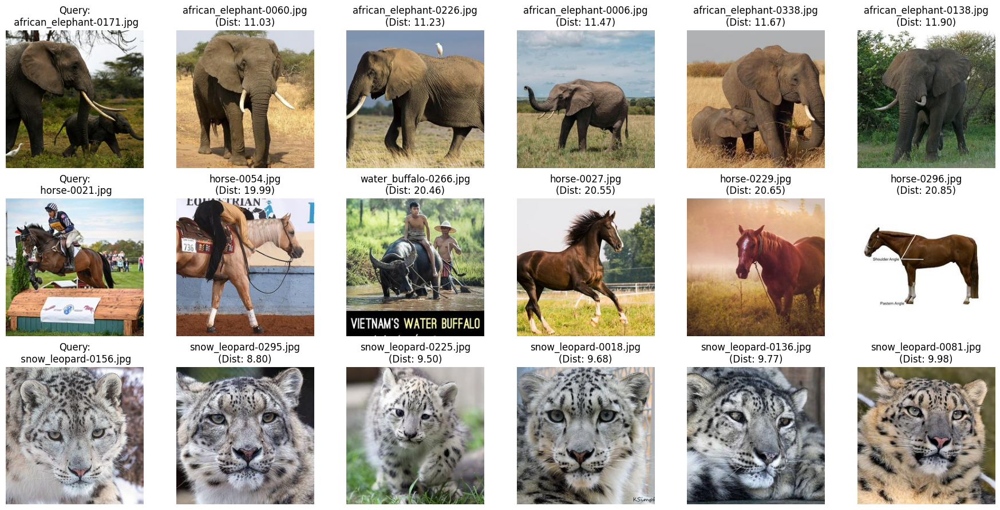

In [138]:
print_retrieved_images(train_image_paths, test_image_paths, test_image_indices, indices, distances)

### Evaluation
The method is then more thoroughly evaluated by retrieving 3 images for each test image.

In [140]:
k = 3
query_distances, query_indexes = kd_tree.query(test_features, k=k)

This function takes the result of the kd-tree query, calculates and displays the accuracy and the classification report.

In [141]:
performance_df = evaluate_performance(query_indexes, test_labels, train_labels, index_to_category, k)

Accuracy: 86.20%

Classification Report:
                  precision    recall  f1-score   support

african_elephant       0.91      0.94      0.93       210
          alpaca       0.87      0.81      0.84       204
  american_bison       0.87      0.90      0.88       210
        anteater       0.82      0.74      0.78       183
      arctic_fox       0.91      0.95      0.93       189
       armadillo       0.95      0.96      0.96       201
          baboon       0.93      0.94      0.94       198
          badger       0.89      0.85      0.87       186
      blue_whale       0.76      0.72      0.74       150
      brown_bear       0.93      0.98      0.95       180
           camel       0.86      0.92      0.89       156
         dolphin       0.79      0.86      0.82       189
         giraffe       0.86      0.97      0.91       183
       groundhog       0.91      0.95      0.93       189
 highland_cattle       0.89      0.77      0.82       189
           horse       0.93   

Since the classification report isn't much readable due to the large number of classes, the function also returns a dataframe which can be easily navigated.

In [25]:
performance_df.sort_values(by='F1-Score', ascending=False)[:10]

,Class,Precision,Recall,F1-Score
23,orangutan,0.980676,0.995098,0.987835
27,red_panda,0.985149,0.990050,0.987593
31,snow_leopard,0.980952,0.980952,0.980952
26,porcupine,0.973684,0.948718,0.961039
5,armadillo,0.950739,0.960199,0.955446
9,brown_bear,0.931217,0.977778,0.953930
44,zebra,0.940828,0.963636,0.952096
16,jackal,0.912568,0.976608,0.943503
6,baboon,0.925743,0.944444,0.935000
18,koala,0.900000,0.969231,0.933333


Analyzing the classes which are harded to retrieve correctly will give us insights on what this method is struggling with.

In [26]:
performance_df.sort_values(by='F1-Score', ascending=True)[:10]

,Class,Precision,Recall,F1-Score
30,seal,0.584270,0.525253,0.553191
29,sea_lion,0.661376,0.612745,0.636132
43,yak,0.689873,0.698718,0.694268
36,vicuna,0.681159,0.728682,0.704120
37,walrus,0.793103,0.660920,0.721003
39,water_buffalo,0.738220,0.734375,0.736292
8,blue_whale,0.760563,0.720000,0.739726
41,wildebeest,0.775401,0.779570,0.777480
3,anteater,0.823171,0.737705,0.778098
35,vampire_bat,0.921053,0.714286,0.804598


The ANMRR (Average Normalized Modified Retrieval Rank) score is a measure of retrieval effectiveness. It ranges between 0 and 1 where 0 indicates perfect retrieval, meaning that all relevant items are ranked at the top, and 1 indicates worst-case retrieval, meaning relevant items are ranked very poorly or not retrieved at all. The "rank" is the position of the correctly retrieved images in the returned array, where the top of the ranking is occupied by the image with lowest distance to the query image.

A ANMRR score of 0.3922 is not bad.

In [27]:
anmrr_value = calculate_anmrr(query_indexes, test_labels, train_labels, k=3)
print(f"ANMRR: {anmrr_value:.4f}")

ANMRR: 0.3922


This function is used to explore a single category by testing on a given number of images, displaying the results and calculating the class-specific ANMRR score. Let's have a look at one of the worst categories.

The issue with this class is clearly due to the high similarity with other categories like "highland_cattle" and "water_buffalo".

Some of these images could also be mistakes of the dataset itself, but since we are not experts of wild life, it's hard to tell.

Retrieving images for category yak...


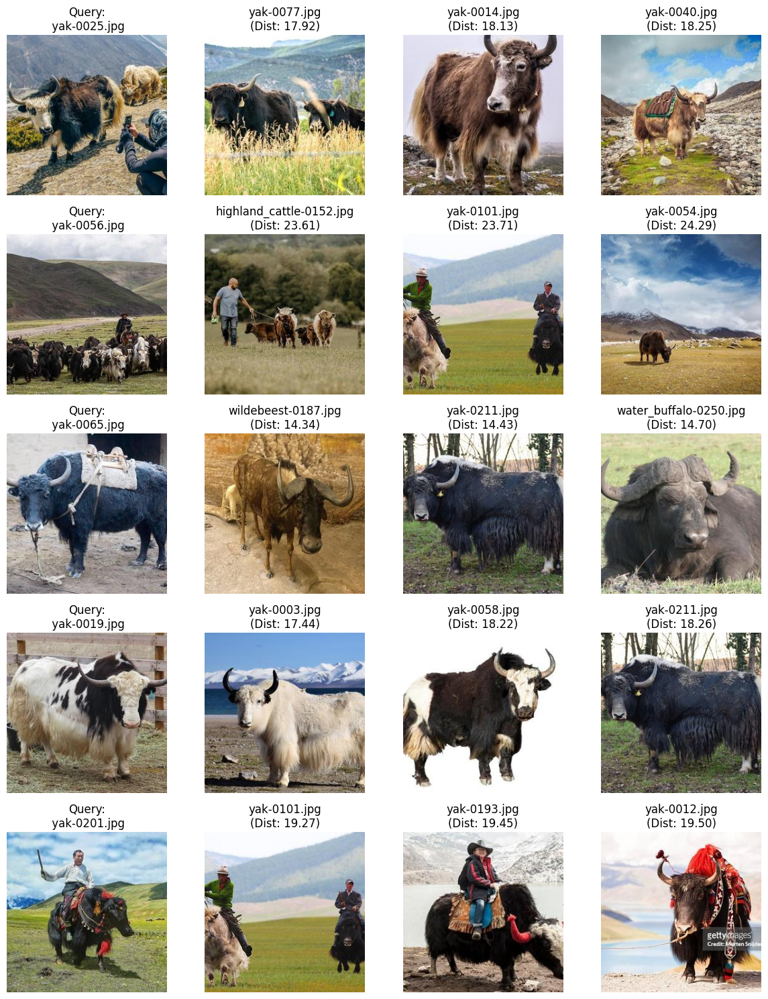

ANMRR for category yak: 0.4000


In [137]:
retrieve_and_evaluate_category(kd_tree, "yak", 5, dataset_test_path, category_to_index, test_features)

Retrieving images for category seal...


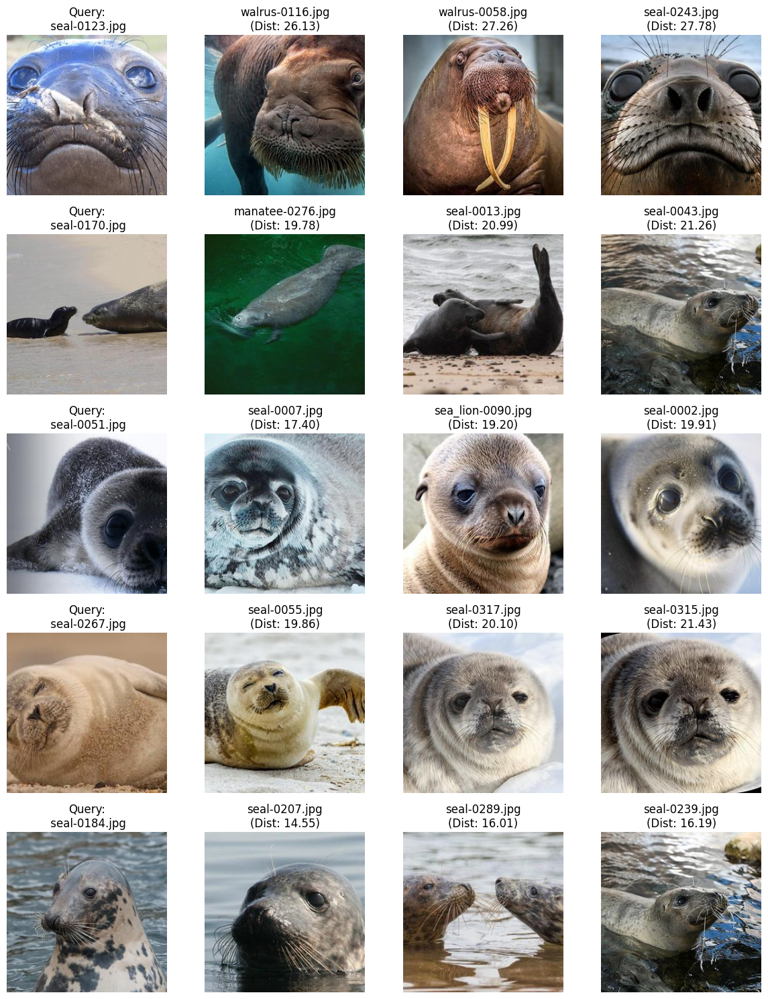

ANMRR for category seal: 0.4727


In [66]:
retrieve_and_evaluate_category(kd_tree, "seal", 5, dataset_test_path, category_to_index, test_features)

# Siamese Network Approach

In order to make a siamese network with triplet loss we'll need the following pieces:
- Encoder model: A neural network used to transform each image into a feature vector (embedding).
- Triples loss function that evaluates loss on:
  - Anchor (the reference image)
  - Positive (an image of the same class as the Anchor)
  - Negative (an image from a different class)

## Creating the Siamese Network

### Triplet Loss function

The triplet loss forces (Anchor - Positive) to come closer and (Anchor - Negative) to move away.

In [29]:
def triplet_loss(margin=0.1):
    def loss(y_true, y_pred):
        anchor, positive, negative = y_pred[:, 0, :], y_pred[:, 1, :], y_pred[:, 2, :]
        pos_dist = tf.reduce_sum(tf.square(anchor - positive), axis=1)
        neg_dist = tf.reduce_sum(tf.square(anchor - negative), axis=1)
        loss = tf.maximum(pos_dist - neg_dist + margin, 0.0)
        return tf.reduce_mean(loss)

    return loss

### Encoder network

This is pretty much the center of the whole siamese architecture, it takes as input 3 images and uses the triplet loss for the learning.

In [30]:
def build_custom_encoder():
    """
    Costruisce un encoder CNN da zero per l'estrazione di feature.
    """
    inputs = layers.Input(shape=(224, 224, 3))

    x = layers.Conv2D(64, (3, 3), activation="relu", padding="same")(inputs)
    x = layers.BatchNormalization()(x, training=True)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(128, (3, 3), activation="relu", padding="same")(x)
    #x = layers.BatchNormalization()(x, training=True)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.Conv2D(256, (3, 3), activation="relu", padding="same")(x)
    #x = layers.BatchNormalization()(x)
    x = layers.MaxPooling2D((2, 2))(x)

    x = layers.GlobalAveragePooling2D()(x)
    x = layers.Dense(128, activation="relu")(x)  # Embedding di 128 dimensioni
    x = layers.Lambda(lambda x: tf.math.l2_normalize(x, axis=1), output_shape=(128,))(x) # Normalizzazione L2

    return Model(inputs, x, name="custom_encoder")


### Triplet generator

We need to create a function to sample (Anchor, Positive, Negative). This will later be used by our encoder network to process 3 images at a time. We can do this by loading the dataset and selecting the images by class.

In [31]:
IMG_SIZE = (224, 224)
batch_size = 64

In [ ]:
def normalize(image):
    return image / 255.0

In [32]:
def load_image(img_path, preprocessing_function):
    image = tf.io.read_file(img_path)
    image = tf.image.decode_jpeg(image, channels=3)  # Ensure 3 channels
    image = tf.image.resize(image, IMG_SIZE)  # Ensure correct size
    image = preprocessing_function(image) # Preprocess the image with the correct pipeline
    return image

In [33]:
def load_triplet(dictionary, dataset_path, preprocessing_function, split='train', ):
    """
    Load one sample, wich will be composed of a (Anchor, Positive, Negative) images combination
    """
    class_names = list(dictionary.keys())

    # choose a random class
    pos_class = np.random.choice(class_names)
    pos_class_path = os.path.join(dataset_path, split, pos_class)

    # choose 2 images from same class
    pos_images = os.listdir(pos_class_path)
    if len(pos_images) < 2:
            # Recursion for classes with <2 images
            return load_triplet(dictionary, dataset_path, preprocessing_function, split)

    anchor_img, positive_img = np.random.choice(pos_images, 2, replace=False)

    # choose a different random class
    neg_class = np.random.choice([c for c in class_names if c != pos_class])
    neg_class_path = os.path.join(dataset_path, split, neg_class)
    negative_img = np.random.choice(os.listdir(neg_class_path))

    anchor = load_image(os.path.join(pos_class_path, anchor_img), preprocessing_function)
    positive = load_image(os.path.join(pos_class_path, positive_img), preprocessing_function)
    negative = load_image(os.path.join(neg_class_path, negative_img), preprocessing_function)

    return anchor, positive, negative, dictionary[pos_class]

Next we need a custom data generator to give the model 3 images to process at once, this function will be called inside data generator to load each triplet:

In [34]:
def triplet_generator(dictionary, batch_size, dataset_path, preprocessing_function, split):
    while True:
        anchors, positives, negatives, labels = [], [], [], []

        for _ in range(batch_size):
            anchor, positive, negative,label = load_triplet(dictionary, dataset_path, preprocessing_function, split)

            anchors.append(anchor)
            positives.append(positive)
            negatives.append(negative)
            labels.append(label)

        yield (np.array(anchors), np.array(positives), np.array(negatives)), np.array(labels)

### Prepare custom dataset

This is the custom data generator that returns triplets:

In [35]:
def create_triplet_dataset(dictionary, batch_size, dataset_path, preprocessing_function, split):
    def gen():
        while True:
            yield next(triplet_generator(dictionary, batch_size, dataset_path, preprocessing_function, split))

    output_signature = (
        (tf.TensorSpec(shape=(batch_size, 224, 224, 3), dtype=tf.float32),  # Anchor
         tf.TensorSpec(shape=(batch_size, 224, 224, 3), dtype=tf.float32),  # Positive
         tf.TensorSpec(shape=(batch_size, 224, 224, 3), dtype=tf.float32)),  # Negative
        tf.TensorSpec(shape=(batch_size,), dtype=tf.float32)  # Dummy label
    )

    return tf.data.Dataset.from_generator(gen, output_signature=output_signature)

Here is a test of this data generator:

Anchor shape: (64, 224, 224, 3)
Positive shape: (64, 224, 224, 3)
Negative shape: (64, 224, 224, 3)
Labels shape: (64,)
labels tf.Tensor(11.0, shape=(), dtype=float32)


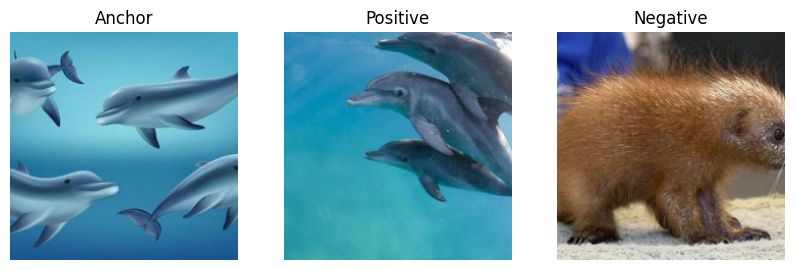

In [36]:
train_dataset_siamese = create_triplet_dataset(category_to_index, batch_size, dataset_path, normalize, split="train")

validation_dataset_siamese = create_triplet_dataset(category_to_index, batch_size, dataset_path, normalize, split="val")

for batch in train_dataset_siamese.take(1):
    (anchors, positives, negatives), labels = batch

    print("Anchor shape:", anchors.shape)
    print("Positive shape:", positives.shape)
    print("Negative shape:", negatives.shape)
    print("Labels shape:", labels.shape)


# Fetch one batch and display a sample
for batch in train_dataset_siamese.take(1):
    (anchors, positives, negatives), labels = batch
    print("labels", labels[0])
    fig, axes = plt.subplots(1, 3, figsize=(10, 5))
    axes[0].imshow((anchors[0].numpy() * 255).astype("uint8"))
    axes[0].set_title("Anchor")
    axes[1].imshow((positives[0].numpy() * 255).astype("uint8"))
    axes[1].set_title("Positive")
    axes[2].imshow((negatives[0].numpy() * 255).astype("uint8"))
    axes[2].set_title("Negative")
    for ax in axes:
        ax.axis("off")
    plt.show()
    break


### Siamese network definition

The complete Siamese Network is then created by wrapping the encoder model and defining the output that will be given to the triplet loss function.

In [37]:
def build_siamese_model(encoder, output_shape=(3, 128)):
    """
    Builds the siamese network that takes as input the 3 images (anchor, positive, negative)
    and returns the three embeddings (feature arrays)
    """
    anchor_input = layers.Input(shape=(224, 224, 3), name="anchor")
    positive_input = layers.Input(shape=(224, 224, 3), name="positive")
    negative_input = layers.Input(shape=(224, 224, 3), name="negative")

    anchor_emb = encoder(anchor_input)
    positive_emb = encoder(positive_input)
    negative_emb = encoder(negative_input)

    embeddings = layers.Lambda(lambda x: tf.stack(x, axis=1), output_shape=output_shape)([anchor_emb, positive_emb, negative_emb])

    return Model(inputs=[anchor_input, positive_input, negative_input], outputs=embeddings, name="siamese_network")


## Training the Siamese Network

### Functions

In [38]:
def plot_history(history_data):
    plt.figure(figsize=(10, 6))
    plt.plot(history_data['loss'], label='Training Loss', marker='o')
    plt.plot(history_data['val_loss'], label='Validation Loss', marker='o')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()

### Training

In [39]:
# Build new encoder model
encoder = build_custom_encoder()
encoder.summary()

Model: "custom_encoder"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)           │ (None, 224, 224, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 224, 224, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 224, 224, 64)        │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 112, 112, 64)        │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 112, 112, 128)       │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 56, 56, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 56, 56, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 28, 28, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d_1           │ (None, 256)                 │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │          32,896 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lambda (Lambda)                      │ (None, 128)                 │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 403,968 (1.54 MB)

 Trainable params: 403,840 (1.54 MB)

 Non-trainable params: 128 (512.00 B)

In [40]:
# Creiamo la rete Siamese con il nuovo encoder
siamese_model = build_siamese_model(encoder)
siamese_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.00005),
    loss=triplet_loss()
)

siamese_model.summary()

Model: "siamese_network"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ anchor (InputLayer)       │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ positive (InputLayer)     │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ negative (InputLayer)     │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ custom_encoder            │ (None, 128)            │        403,968 │ anchor[0][0],          │
│ (Functional)              │                        │                │ positive[0][0],        │
│                           │                        │                │ negative[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 3, 128)         │              0 │ custom_encoder[0][0],  │
│                           │                        │                │ custom_encoder[1][0],  │
│                           │                        │                │ custom_encoder[2][0]   │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 403,968 (1.54 MB)

 Trainable params: 403,840 (1.54 MB)

 Non-trainable params: 128 (512.00 B)

In [41]:
# Define the load/save path (the folder)
model_folder = "/content/drive/My Drive/IR Saves/SiameseNetwork Approach/SiameseNetwork Approach"

# Create the folder if it doesn't exist
os.makedirs(model_folder, exist_ok=True)

# Define the full file paths
siamese_model_file = os.path.join(model_folder, "siamese_model.keras")
encoder_model_file = os.path.join(model_folder, "encoder_model.keras")

# Check if model files exist
if os.path.exists(siamese_model_file) and os.path.exists(encoder_model_file):
    # Load the models
    siamese_model = keras.models.load_model(siamese_model_file, custom_objects={'loss': triplet_loss()})
    encoder = keras.models.load_model(encoder_model_file)
    print("Models loaded successfully from Google Drive.")
else:
    # Build and train the models
    print("Models not found. Building and training...")

    siamese_history = siamese_model.fit(train_dataset_siamese,
                    epochs=40,
                    steps_per_epoch=10,
                    validation_steps = 10,
                    validation_data=validation_dataset_siamese
                    )

    # Create the directory if it doesn't exist
    os.makedirs(model_folder, exist_ok=True)

    # Save the models
    siamese_model.save(os.path.join(model_folder, "siamese_model.keras"))
    encoder.save(os.path.join(model_folder, "encoder_model.keras"))
    print("Models saved successfully to Google Drive.")


Models not found. Building and training...
Epoch 1/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 45s 3s/step - loss: 0.0902 - val_loss: 0.0909
Epoch 2/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - loss: 0.0882 - val_loss: 0.0910
Epoch 3/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 21s 2s/step - loss: 0.0852 - val_loss: 0.0885
Epoch 4/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0864 - val_loss: 0.0883
Epoch 5/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0844 - val_loss: 0.0879
Epoch 6/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0881 - val_loss: 0.0779
Epoch 7/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0766 - val_loss: 0.0859
Epoch 8/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - loss: 0.0877 - val_loss: 0.0818
Epoch 9/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0787 - val_loss: 0.0899
Epoch 10/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0808 - val_loss: 0.0851
Epoch 11/40
10/10 ━━━━━━━━━━━━━━━━━━━━ 20s 2s/step - loss: 0.0845 - val_loss: 0.0809
Epoch 12/40
10/10 ━━━━━━━━━━━━━

History saved successfully.


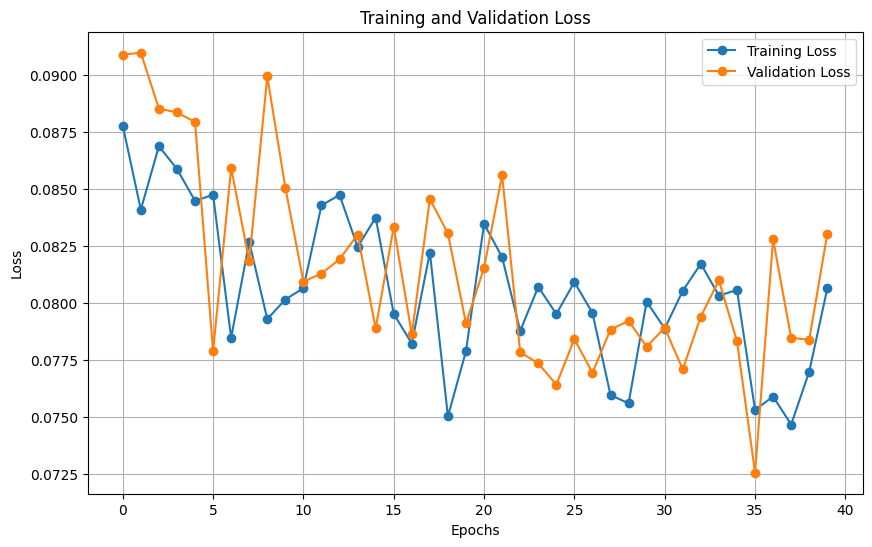

In [42]:
history_save_path = '/content/drive/My Drive/IR Saves/siamese_history.json'

# Check if history file exists
if os.path.exists(history_save_path):
    # Load history from file
    with open(history_save_path, 'r') as f:
        siamese_history = json.load(f)
    print("History loaded successfully.")
else:
    # Save history after training
    with open(history_save_path, 'w') as f:
        json.dump(siamese_history.history, f)
    print("History saved successfully.")

# Call the function to plot history
plot_history(siamese_history if isinstance(siamese_history, dict) else siamese_history.history)

The network doesn't seem to be learning much, the training phase looks pretty much flat. This is most likely due to the size of the hand-made model, which is too small to capture the differences of the 45 different classes.

## Image Retrieval and Evaluation


 ### Features Extraction

In [43]:
prefix = "/content/drive/My Drive/" #

In [44]:
dataset_train_path = dataset_path + "/train"
train_features_path = prefix+"IR Saves/SiameseNetwork Approach/train_features.npy"
train_labels_path = prefix+"IR Saves/SiameseNetwork Approach/train_labels.npy"
train_image_names_path = prefix+"IR Saves/SiameseNetwork Approach/train_image_names.npy"

train_features_siamese , train_labels_siamese, train_image_paths_siamese = load_or_compute_features(encoder, train_features_path, train_labels_path, train_image_names_path, dataset_train_path, category_to_index)

Files missing, computing features...
Processing folder dataset/train/african_elephant
Processing folder dataset/train/alpaca
Processing folder dataset/train/american_bison
Processing folder dataset/train/anteater
Processing folder dataset/train/arctic_fox
Processing folder dataset/train/armadillo
Processing folder dataset/train/baboon
Processing folder dataset/train/badger
Processing folder dataset/train/blue_whale
Processing folder dataset/train/brown_bear
Processing folder dataset/train/camel
Processing folder dataset/train/dolphin
Processing folder dataset/train/giraffe
Processing folder dataset/train/groundhog
Processing folder dataset/train/highland_cattle
Processing folder dataset/train/horse
Processing folder dataset/train/jackal
Processing folder dataset/train/kangaroo
Processing folder dataset/train/koala
Processing folder dataset/train/manatee
Processing folder dataset/train/mongoose
Processing folder dataset/train/mountain_goat
Processing folder dataset/train/opossum
Process

In [45]:
dataset_val_path = dataset_path + "/val"
val_features_path = prefix+"IR Saves/SiameseNetwork Approach/val_features.npy"
val_labels_path = prefix+"IR Saves/SiameseNetwork Approach/val_labels.npy"
val_image_names_path = prefix+"IR Saves/SiameseNetwork Approach/val_image_names.npy"

val_features_siamese, val_labels_siamese, val_image_paths_siamese = load_or_compute_features(encoder, val_features_path, val_labels_path, val_image_names_path, dataset_val_path, category_to_index)

Files missing, computing features...
Processing folder dataset/val/african_elephant
Processing folder dataset/val/alpaca
Processing folder dataset/val/american_bison
Processing folder dataset/val/anteater
Processing folder dataset/val/arctic_fox
Processing folder dataset/val/armadillo
Processing folder dataset/val/baboon
Processing folder dataset/val/badger
Processing folder dataset/val/blue_whale
Processing folder dataset/val/brown_bear
Processing folder dataset/val/camel
Processing folder dataset/val/dolphin
Processing folder dataset/val/giraffe
Processing folder dataset/val/groundhog
Processing folder dataset/val/highland_cattle
Processing folder dataset/val/horse
Processing folder dataset/val/jackal
Processing folder dataset/val/kangaroo
Processing folder dataset/val/koala
Processing folder dataset/val/manatee
Processing folder dataset/val/mongoose
Processing folder dataset/val/mountain_goat
Processing folder dataset/val/opossum
Processing folder dataset/val/orangutan
Processing fo

In [46]:
dataset_test_path = dataset_path + "/test"
test_features_path = prefix+"IR Saves/SiameseNetwork Approach/test_features.npy"
test_labels_path = prefix+"IR Saves/SiameseNetwork Approach/test_labels.npy"
test_image_names_path = prefix+"IR Saves/SiameseNetwork Approach/test_image_names.npy"

test_features_siamese, test_labels_siamese, test_image_paths_siamese = load_or_compute_features(encoder, test_features_path, test_labels_path, test_image_names_path, dataset_test_path, category_to_index)

Files missing, computing features...
Processing folder dataset/test/african_elephant
Processing folder dataset/test/alpaca
Processing folder dataset/test/american_bison
Processing folder dataset/test/anteater
Processing folder dataset/test/arctic_fox
Processing folder dataset/test/armadillo
Processing folder dataset/test/baboon
Processing folder dataset/test/badger
Processing folder dataset/test/blue_whale
Processing folder dataset/test/brown_bear
Processing folder dataset/test/camel
Processing folder dataset/test/dolphin
Processing folder dataset/test/giraffe
Processing folder dataset/test/groundhog
Processing folder dataset/test/highland_cattle
Processing folder dataset/test/horse
Processing folder dataset/test/jackal
Processing folder dataset/test/kangaroo
Processing folder dataset/test/koala
Processing folder dataset/test/manatee
Processing folder dataset/test/mongoose
Processing folder dataset/test/mountain_goat
Processing folder dataset/test/opossum
Processing folder dataset/test

### KD-Tree

In [47]:
kd_tree_siamese = KDTree(train_features_siamese)

#### Testing on a few images

Testing the kd-tree and its returned data on 3 random images.

In [48]:
test_image_indices_for_siamese = [0, 1000, 2000]
test_images_siamese = test_features_siamese[test_image_indices_for_siamese]
test_images_siamese.shape

(3, 128)

In [49]:
distances_siamese, indices_siamese = kd_tree_siamese.query(test_images_siamese, k=5)

We can see that by picking the same 3 test images as before, the results are much worse.

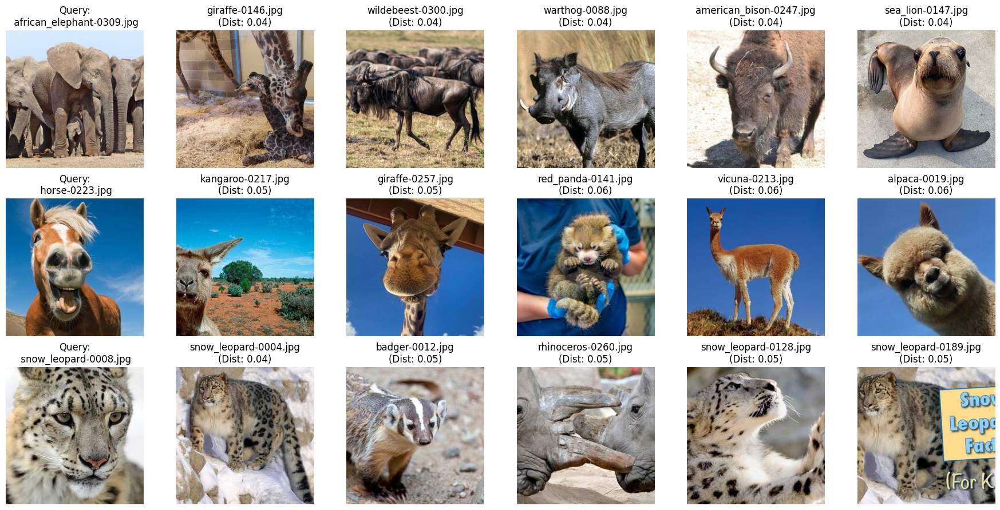

In [52]:
print_retrieved_images(train_image_paths_siamese, test_image_paths_siamese, test_image_indices_for_siamese, indices_siamese, distances_siamese)

### Evaluation
The method is then more thoroughly evaluated by retrieving 3 images for each test image.

In [53]:
k = 3
query_distances_siamese, query_indexes_siamese = kd_tree_siamese.query(test_features_siamese, k=k)

The accuracy appears to be quite low.

In [54]:
performance_df_siamese = evaluate_performance(query_indexes_siamese, test_labels_siamese, train_labels_siamese, index_to_category, k)

Accuracy: 12.14%

Classification Report:
                  precision    recall  f1-score   support

african_elephant       0.07      0.08      0.07       210
          alpaca       0.06      0.06      0.06       204
  american_bison       0.11      0.09      0.10       210
        anteater       0.10      0.10      0.10       183
      arctic_fox       0.25      0.21      0.23       189
       armadillo       0.11      0.10      0.11       201
          baboon       0.05      0.06      0.05       198
          badger       0.05      0.06      0.06       186
      blue_whale       0.43      0.38      0.40       150
      brown_bear       0.07      0.08      0.08       180
           camel       0.16      0.15      0.16       156
         dolphin       0.28      0.33      0.30       189
         giraffe       0.09      0.08      0.08       183
       groundhog       0.09      0.10      0.09       189
 highland_cattle       0.10      0.08      0.09       189
           horse       0.06   

Even the best classes cannot reach a good level of performance

In [55]:
performance_df_siamese.sort_values(by='F1-Score', ascending=False)[:10]

,Class,Precision,Recall,F1-Score
19,manatee,0.437500,0.446078,0.441748
8,blue_whale,0.431818,0.380000,0.404255
44,zebra,0.495050,0.303030,0.375940
25,polar_bear,0.336788,0.300926,0.317848
11,dolphin,0.280543,0.328042,0.302439
31,snow_leopard,0.228000,0.271429,0.247826
4,arctic_fox,0.250000,0.211640,0.229226
26,porcupine,0.220238,0.189744,0.203857
27,red_panda,0.170543,0.218905,0.191721
10,camel,0.162162,0.153846,0.157895


And some other classes are basically not even learned at all.

In [56]:
performance_df_siamese.sort_values(by='F1-Score', ascending=True)[:10]

,Class,Precision,Recall,F1-Score
20,mongoose,0.034483,0.028736,0.031348
28,rhinoceros,0.028986,0.035714,0.032000
22,opossum,0.035573,0.045455,0.039911
43,yak,0.047619,0.044872,0.046205
32,squirrel,0.048913,0.046154,0.047493
34,tapir,0.054217,0.046875,0.050279
17,kangaroo,0.054945,0.052083,0.053476
6,baboon,0.052885,0.055556,0.054187
15,horse,0.055866,0.053763,0.054795
41,wildebeest,0.056122,0.059140,0.057592


THe ANMRR shows how much worse this model is, considering that "1" would be the worst.

In [57]:
anmrr_value_siamese = calculate_anmrr(query_indexes_siamese, test_labels_siamese, train_labels_siamese, k=3)
print(f"ANMRR: {anmrr_value_siamese:.4f}")

ANMRR: 0.8801


Let's see some examples for the best class

Retrieving images for category manatee...


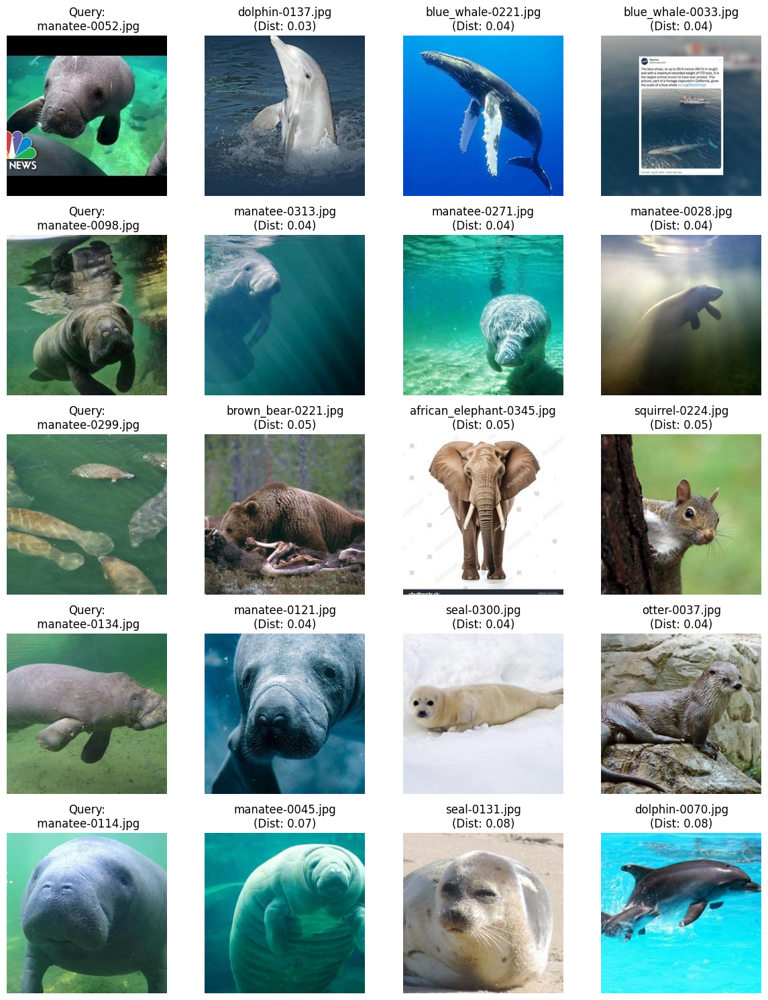

ANMRR for category manatee: 0.5091


In [58]:
retrieve_and_evaluate_category(kd_tree_siamese, "manatee", 5, dataset_test_path, category_to_index, test_features_siamese)

And some examples for the worst class

In [ ]:
retrieve_and_evaluate_category(kd_tree_siamese, "mongoose", 5, dataset_test_path, category_to_index, test_features_siamese)

# Fine-Tuned Siamese Network Approach

To improve the previous model, instead of just creating a bigger model, we decided to fine tune the MobileNetV2 model to have a "hot start" and to require less training.

## Fine-Tuning the Siamese Network

In [96]:
train_dataset_siamese2 = create_triplet_dataset(category_to_index, batch_size, dataset_path, preprocess_input, split="train")

validation_dataset_siamese2 = create_triplet_dataset(category_to_index, batch_size, dataset_path, preprocess_input, split="val")

In [97]:
encoder2 = MobileNetV2(weights="imagenet", include_top=False, pooling="avg", input_shape=(224, 224, 3))

In [98]:
# Creiamo la rete Siamese con il nuovo encoder
siamese_model2 = build_siamese_model(encoder2, output_shape=(3, 1280))
siamese_model2.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.00001),
    loss=triplet_loss(0.1)
)

siamese_model2.summary()

Model: "siamese_network"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ anchor (InputLayer)       │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ positive (InputLayer)     │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ negative (InputLayer)     │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ mobilenetv2_1.00_224      │ (None, 1280)           │      2,257,984 │ anchor[0][0],          │
│ (Functional)              │                        │                │ positive[0][0],        │
│                           │                        │                │ negative[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_5 (Lambda)         │ (None, 3, 1280)        │              0 │ mobilenetv2_1.00_224[… │
│                           │                        │                │ mobilenetv2_1.00_224[… │
│                           │                        │                │ mobilenetv2_1.00_224[… │
└───────────────────────────┴────────────────────────┴────────────────┴────────────────────────┘

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 2,223,872 (8.48 MB)

 Non-trainable params: 34,112 (133.25 KB)

In [105]:
# Define the load/save path (the folder)
model_folder = "/content/drive/My Drive/IR Saves/SiameseNetwork2 Approach"

# Create the folder if it doesn't exist
os.makedirs(model_folder, exist_ok=True)

# Define the full file paths
siamese_model_file = os.path.join(model_folder, "siamese_model2.keras")
encoder_model_file = os.path.join(model_folder, "encoder_model2.keras")

# Check if model files exist
if os.path.exists(siamese_model_file) and os.path.exists(encoder_model_file):
    # Load the models
    siamese_model2 = keras.models.load_model(siamese_model_file, custom_objects={'loss': triplet_loss()}, safe_mode=False)
    encoder2 = keras.models.load_model(encoder_model_file, safe_mode=False)
    print("Models loaded successfully from Google Drive.")
else:
    # Build and train the models
    print("Models not found. Building and training...")

    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=5,
        restore_best_weights=True
    )

    siamese_history2 = siamese_model2.fit(train_dataset_siamese2,
                  epochs=40,
                  steps_per_epoch=25,
                  validation_steps=25,
                  validation_data=validation_dataset_siamese2,
                  callbacks=[early_stopping]
                  )

    # Create the directory if it doesn't exist
    os.makedirs(model_folder, exist_ok=True)

    # Save the models
    siamese_model.save(os.path.join(model_folder, "siamese_model2.keras"))
    encoder.save(os.path.join(model_folder, "encoder_model2.keras"))
    print("Models saved successfully to Google Drive.")

Models loaded successfully from Google Drive.


History loaded successfully.


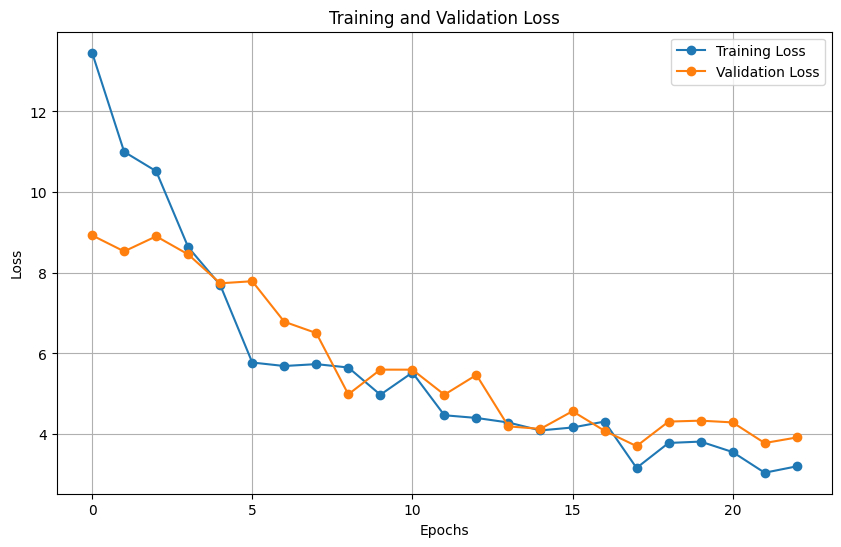

In [101]:
history_save_path = '/content/drive/My Drive/IR Saves/SiameseNetwork2 Approach/siamese_history2.json'

# Check if history file exists
if os.path.exists(history_save_path):
    # Load history from file
    with open(history_save_path, 'r') as f:
        siamese_history2 = json.load(f)
    print("History loaded successfully.")
else:
    # Save history after training
    with open(history_save_path, 'w') as f:
        json.dump(siamese_history2.history, f)
    print("History saved successfully.")

# Call the function to plot history
plot_history(siamese_history2 if isinstance(siamese_history2, dict) else siamese_history2.history)

This models appears to be much better.

## Image Retrieval and Evaluation

### Features Extraction

In [91]:
prefix = "/content/drive/My Drive/" #

In [106]:
dataset_train_path = dataset_path + "/train"
train_features_path = prefix+"IR Saves/SiameseNetwork2 Approach/train_features.npy"
train_labels_path = prefix+"IR Saves/SiameseNetwork2 Approach/train_labels.npy"
train_image_names_path = prefix+"IR Saves/SiameseNetwork2 Approach/train_image_names.npy"

train_features_siamese2 , train_labels_siamese2, train_image_paths_siamese2 = load_or_compute_features(encoder2, train_features_path, train_labels_path, train_image_names_path, dataset_train_path, category_to_index)

Loaded existing files.


In [107]:
dataset_val_path = dataset_path + "/val"
val_features_path = prefix+"IR Saves/SiameseNetwork2 Approach/val_features.npy"
val_labels_path = prefix+"IR Saves/SiameseNetwork2 Approach/val_labels.npy"
val_image_names_path = prefix+"IR Saves/SiameseNetwork2 Approach/val_image_names.npy"

val_features_siamese2, val_labels_siamese2, val_image_paths_siamese2 = load_or_compute_features(encoder2, val_features_path, val_labels_path, val_image_names_path, dataset_val_path, category_to_index)

Loaded existing files.


In [108]:
dataset_test_path = dataset_path + "/test"
test_features_path = prefix+"IR Saves/SiameseNetwork2 Approach/test_features.npy"
test_labels_path = prefix+"IR Saves/SiameseNetwork2 Approach/test_labels.npy"
test_image_names_path = prefix+"IR Saves/SiameseNetwork2 Approach/test_image_names.npy"

test_features_siamese2, test_labels_siamese2, test_image_paths_siamese2 = load_or_compute_features(encoder2, test_features_path, test_labels_path, test_image_names_path, dataset_test_path, category_to_index)

Loaded existing files.


### KD-Tree

In [109]:
kd_tree_siamese2 = KDTree(train_features_siamese2)

#### Testing on a few images


In [110]:
len(test_features_siamese2)

2786

In [111]:
test_image_indices_for_siamese2 = [0, 1000, 2000]
test_images_siamese2 = test_features_siamese2[test_image_indices_for_siamese2]
test_images_siamese2.shape

(3, 1280)

In [112]:
distances_siamese2, indices_siamese2 = kd_tree_siamese2.query(test_images_siamese2, k=5)

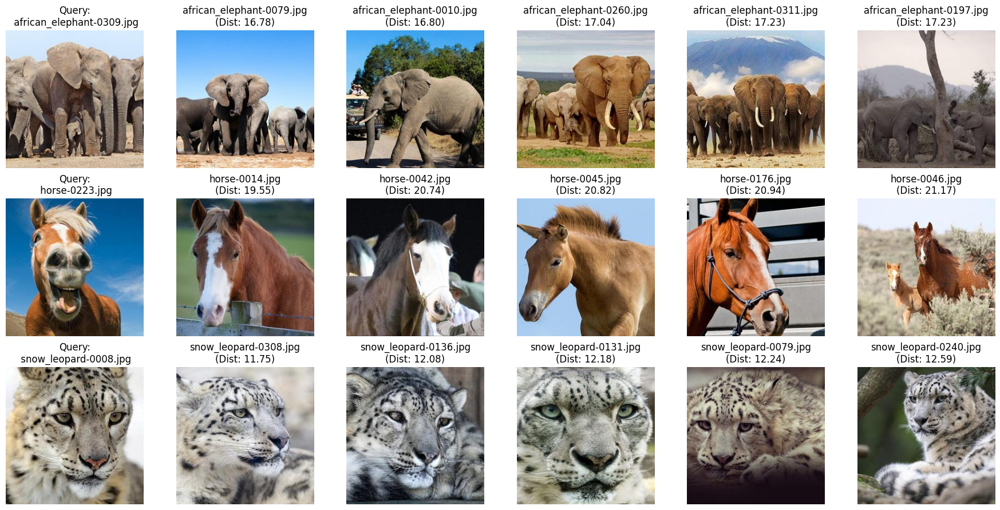

In [115]:
print_retrieved_images(train_image_paths_siamese, test_image_paths_siamese, test_image_indices_for_siamese2, indices_siamese2, distances_siamese2)

And it's clear how the results are really good now.

### Evaluation
The method is then more thoroughly evaluated by retrieving 3 images for each test image.

In [116]:
k = 3
query_distances_siamese2, query_indexes_siamese2 = kd_tree_siamese2.query(test_features_siamese2, k=k)

The result's accuracy is just a bit worse than the baseline method.

In [117]:
performance_df_siamese2 = evaluate_performance(query_indexes_siamese2, test_labels_siamese2, train_labels_siamese2, index_to_category, k)

Accuracy: 83.80%

Classification Report:
                  precision    recall  f1-score   support

african_elephant       0.93      0.95      0.94       210
          alpaca       0.76      0.67      0.71       204
  american_bison       0.90      0.88      0.89       210
        anteater       0.73      0.76      0.74       183
      arctic_fox       0.84      0.90      0.87       189
       armadillo       0.92      0.99      0.95       201
          baboon       0.95      0.88      0.91       198
          badger       0.90      0.84      0.87       186
      blue_whale       0.66      0.77      0.71       150
      brown_bear       0.93      0.96      0.94       180
           camel       0.74      0.79      0.77       156
         dolphin       0.74      0.79      0.76       189
         giraffe       0.86      0.98      0.92       183
       groundhog       0.90      0.93      0.91       189
 highland_cattle       0.88      0.86      0.87       189
           horse       0.83   

In [118]:
performance_df_siamese2.sort_values(by='F1-Score', ascending=False)[:10]

,Class,Precision,Recall,F1-Score
27,red_panda,0.985294,1.000000,0.992593
31,snow_leopard,0.980769,0.971429,0.976077
26,porcupine,0.983871,0.938462,0.960630
23,orangutan,0.956098,0.960784,0.958435
44,zebra,0.946429,0.963636,0.954955
5,armadillo,0.920930,0.985075,0.951923
9,brown_bear,0.929730,0.955556,0.942466
0,african_elephant,0.925581,0.947619,0.936471
16,jackal,0.887701,0.970760,0.927374
18,koala,0.883178,0.969231,0.924205


In [119]:
performance_df_siamese2.sort_values(by='F1-Score', ascending=True)[:10]

,Class,Precision,Recall,F1-Score
30,seal,0.520737,0.570707,0.544578
29,sea_lion,0.634146,0.509804,0.565217
43,yak,0.701299,0.692308,0.696774
8,blue_whale,0.657143,0.766667,0.707692
1,alpaca,0.759777,0.666667,0.710183
36,vicuna,0.712121,0.728682,0.720307
39,water_buffalo,0.751412,0.692708,0.720867
41,wildebeest,0.715026,0.741935,0.728232
3,anteater,0.727749,0.759563,0.743316
37,walrus,0.825175,0.678161,0.744479


The ANMRR score gets pretty close to the baseline method

In [120]:
anmrr_value_siamese2 = calculate_anmrr(query_indexes_siamese2, test_labels_siamese2, train_labels_siamese2, k=3)
print(f"ANMRR: {anmrr_value_siamese2:.4f}")

ANMRR: 0.4007


Retrieving images for category seal...


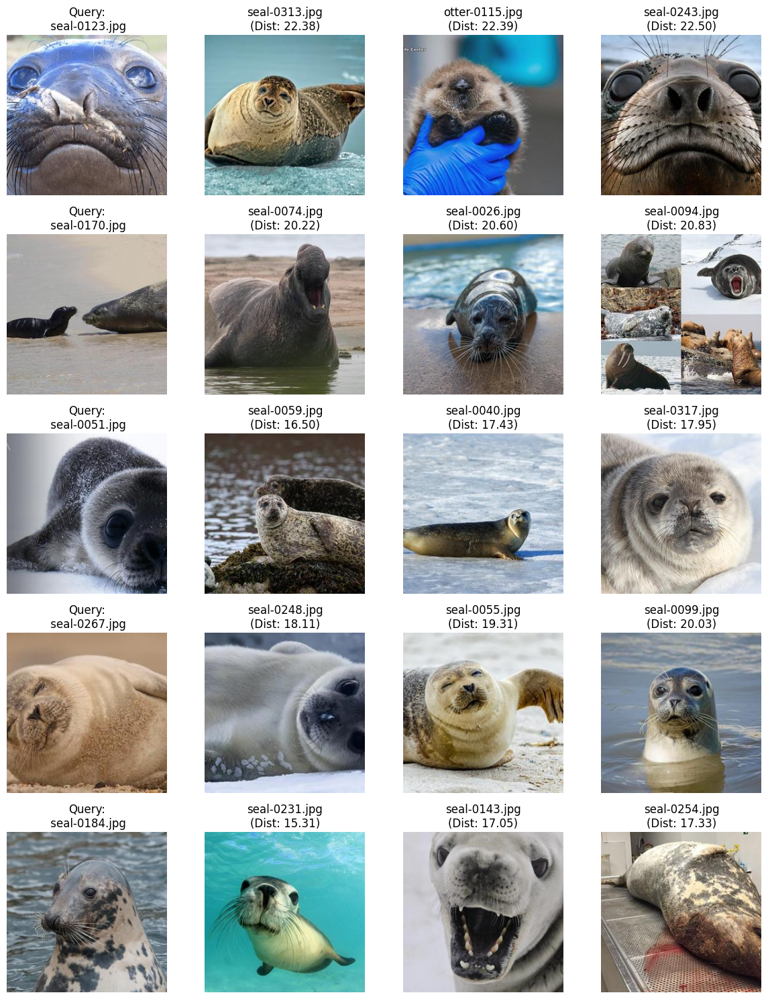

ANMRR for category seal: 0.3636


In [121]:
retrieve_and_evaluate_category(kd_tree_siamese2, "seal", 5, dataset_test_path, category_to_index, test_features_siamese2)

# Comparing and Combining the Two Best Approaches

## Comparison

The comparison is interesing because the delta between the F1-Scores of the two best methods (first and third approaches) almost always favors the method that returned the best results, which was expected. The interesting thing is that a few classes are better retrieved by the other model, even if marginally.

In [153]:
# Extract the relevant columns
df1 = performance_df[['Class', 'F1-Score']].rename(columns={'F1-Score': 'F1-Score_df1'})
df2 = performance_df_siamese2[['Class', 'F1-Score']].rename(columns={'F1-Score': 'F1-Score_df2'})

# Merge the two DataFrames on the 'Class' column
merged_df = pd.merge(df1, df2, on='Class')

# Calculate the absolute difference between the F1 scores
merged_df['Delta'] = merged_df['F1-Score_df1'] - merged_df['F1-Score_df2']

# Rename columns for clarity
merged_df.rename(columns={'F1-Score_df1': 'F1-Score_1', 'F1-Score_df2': 'F1-Score_2'}, inplace=True)

# Display the new DataFrame
merged_df.sort_values(by='Delta', ascending=False)

,Class,F1-Score_1,F1-Score_2,Delta
1,alpaca,0.837563,0.710183,0.127381
10,camel,0.885449,0.767802,0.117647
34,tapir,0.861538,0.772512,0.089027
15,horse,0.855491,0.772334,0.083157
29,sea_lion,0.636132,0.565217,0.070915
4,arctic_fox,0.932642,0.870229,0.062413
11,dolphin,0.820253,0.762148,0.058105
41,wildebeest,0.777480,0.728232,0.049248
28,rhinoceros,0.816092,0.768328,0.047764
24,otter,0.842572,0.802784,0.039788


## Combination

To combine the two methods, we simply normalized each array of feature arrays and concatenated them.

In [175]:
scaler = MinMaxScaler()

normalized_train_features = scaler.fit_transform(train_features)
normalized_train_features_siamese2 = scaler.fit_transform(train_features_siamese2)
combined_train_features = np.hstack((normalized_train_features, normalized_train_features_siamese2))

normalized_test_features = scaler.fit_transform(test_features)
normalized_test_features_siamese2 = scaler.fit_transform(test_features_siamese2)
combined_test_features = np.hstack((normalized_test_features, normalized_test_features_siamese2))

A new kd-tree was then defined, with the use of the combined feature arrays

In [173]:
kd_tree_combined = KDTree(combined_train_features)

In [178]:
k = 3
query_distances_combined, query_indexes_combined = kd_tree_combined.query(combined_test_features, k=k)

The performance of the combined method is surprisingly much much higher. It would probably be pretty difficult to get a better result considering that there are some errors or very difficult images in the dataset, and also this performance is related to the 3 images returned, not only 1.

In [179]:
performance_df_combined = evaluate_performance(query_indexes_combined, test_labels, train_labels, index_to_category, k)

Accuracy: 94.17%

Classification Report:
                  precision    recall  f1-score   support

african_elephant       0.98      1.00      0.99       210
          alpaca       0.95      0.91      0.93       204
  american_bison       0.92      1.00      0.96       210
        anteater       0.94      0.90      0.92       183
      arctic_fox       0.99      0.99      0.99       189
       armadillo       0.99      1.00      0.99       201
          baboon       0.99      0.98      0.99       198
          badger       0.95      0.92      0.94       186
      blue_whale       0.94      0.91      0.93       150
      brown_bear       0.99      0.99      0.99       180
           camel       0.89      0.98      0.94       156
         dolphin       0.92      0.96      0.94       189
         giraffe       0.97      1.00      0.99       183
       groundhog       0.95      0.97      0.96       189
 highland_cattle       0.97      0.94      0.95       189
           horse       0.97   

The ANMRR value also becomes better (lower).

In [180]:
anmrr_value_combined = calculate_anmrr(query_indexes_combined, test_labels, train_labels, k=3)
print(f"ANMRR: {anmrr_value_combined:.4f}")

ANMRR: 0.3723
